In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as f
import torchvision.transforms as T


import math
import random
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from tqdm.notebook import trange,tqdm


c:\ProgramData\Anaconda3\lib\site-packages\torchvision\io\image.py:13: UserWarning: Failed to load image Python extension: '[WinError 127] The specified procedure could not be found'If you don't plan on using image functionality from `torchvision.io`, you can ignore this warning. Otherwise, there might be something wrong with your environment. Did you have `libjpeg` or `libpng` installed before building `torchvision` from source?
  warn(
C:\Users\bhard\AppData\Roaming\Python\Python39\site-packages\matplotlib\projections\__init__.py:63: UserWarning: Unable to import Axes3D. This may be due to multiple versions of Matplotlib being installed (e.g. as a system package and as a pip package). As a result, the 3D projection is not available.
  warnings.warn("Unable to import Axes3D. This may be due to multiple versions of "


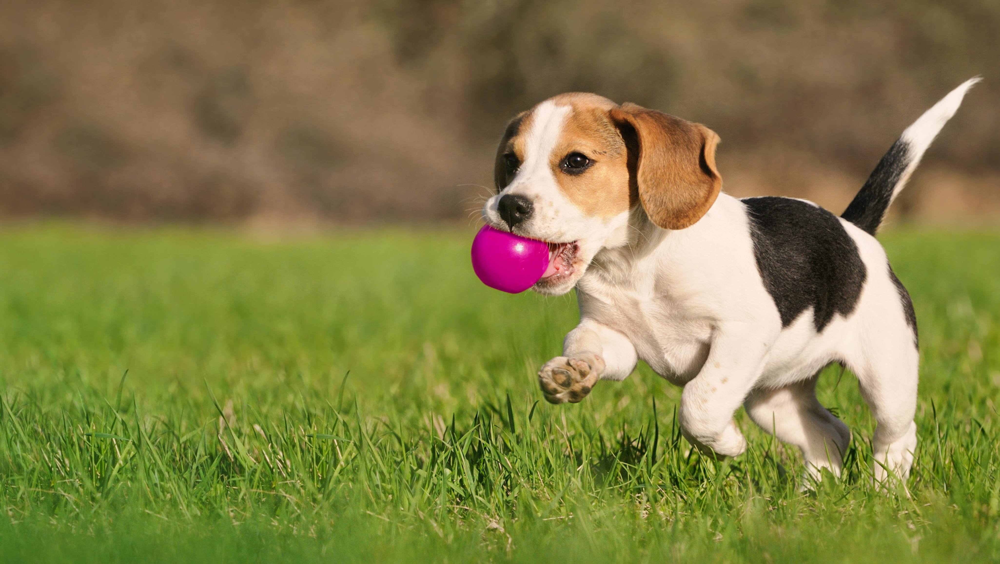

In [2]:
test_img1 = Image.open("puppy.jpeg").convert("RGB")
test_img1

In [3]:
transform = T.ToTensor()
resize= T.Resize(512)
test_img1 = transform(resize(test_img1))
print("Image Shape",test_img1.shape)

Image Shape torch.Size([3, 512, 906])


In [13]:
gx =  torch.FloatTensor([[-1,0,1],[-1,0,2],[-1,0,1]]).unsqueeze(0)
gx = torch.repeat_interleave(gx,3,0).unsqueeze(0)

print("Kernel Shape",gx.shape)
print(gx)

Kernel Shape torch.Size([1, 3, 3, 3])
tensor([[[[-1.,  0.,  1.],
          [-1.,  0.,  2.],
          [-1.,  0.,  1.]],

         [[-1.,  0.,  1.],
          [-1.,  0.,  2.],
          [-1.,  0.,  1.]],

         [[-1.,  0.,  1.],
          [-1.,  0.,  2.],
          [-1.,  0.,  1.]]]])


In [14]:
gy= torch.FloatTensor([[1,2,1],[0,0,0],[-1,-2,-1]]).unsqueeze(0)
gy= torch.repeat_interleave(gy,3,0).unsqueeze(0)
print("kernel size:",gy.shape)
print(gy)

kernel size: torch.Size([1, 3, 3, 3])
tensor([[[[ 1.,  2.,  1.],
          [ 0.,  0.,  0.],
          [-1., -2., -1.]],

         [[ 1.,  2.,  1.],
          [ 0.,  0.,  0.],
          [-1., -2., -1.]],

         [[ 1.,  2.,  1.],
          [ 0.,  0.,  0.],
          [-1., -2., -1.]]]])


Feature Map Shape: torch.Size([1, 1, 510, 904])


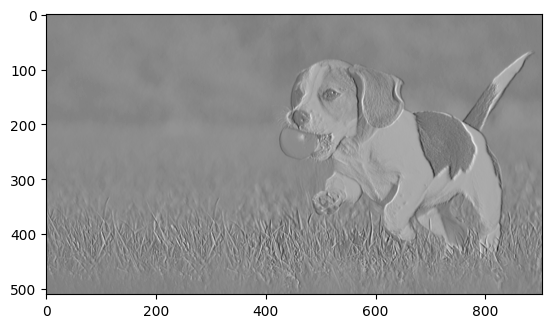

In [15]:
conv_out1= f.conv2d(test_img1.unsqueeze(0), gx,bias=None,stride=1)
print("Feature Map Shape:",conv_out1.shape)
_= plt.imshow(torch.squeeze(conv_out1),cmap='gray')

feature mapm shape: torch.Size([1, 1, 510, 904])


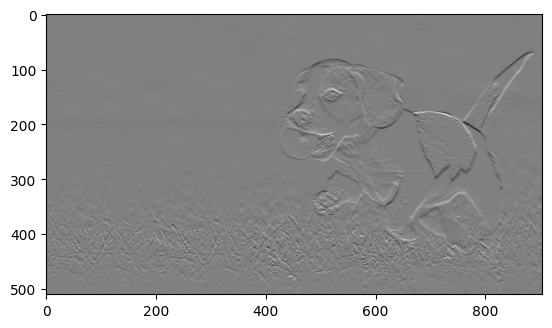

In [16]:
conv_out2= f.conv2d(test_img1.unsqueeze(0),gy,bias=None, stride=1)
print("feature mapm shape:",conv_out2.shape)
_= plt.imshow(torch.squeeze(conv_out2),cmap='gray')

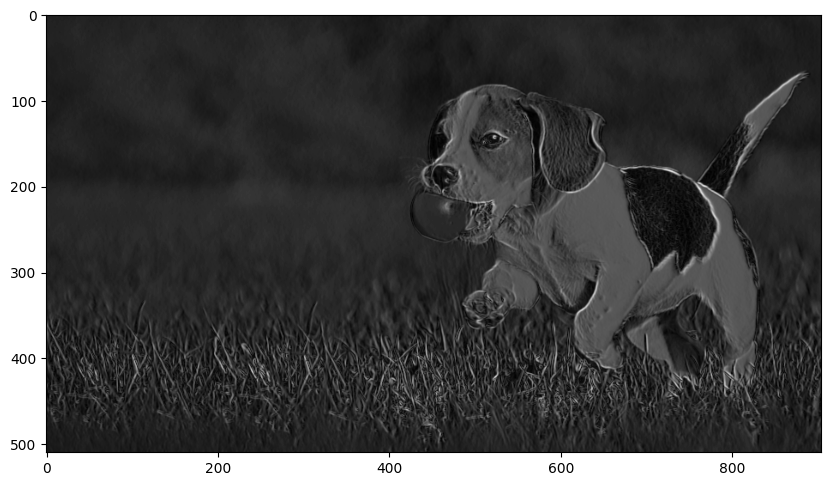

In [18]:

conv_out= (conv_out1.pow(2)+conv_out2.pow(2)).sqrt()
plt.figure(figsize=(10,10))
plt.imshow(conv_out.squeeze(),cmap='gray')

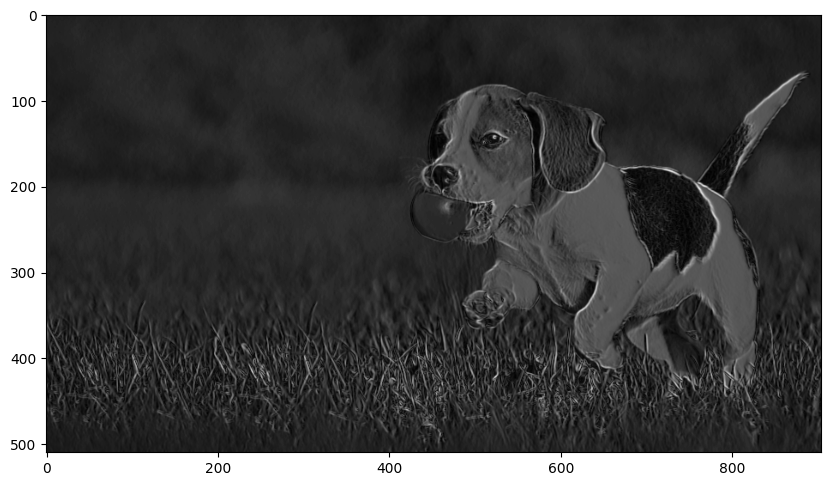

In [20]:
gxy= torch.cat((gx,gy),0)

conv_out3= f.conv2d(test_img1.unsqueeze(0),gxy,bias=None, stride=1)

conv_out_mag = conv_out3.pow(2).sum(1).sqrt()


plt.figure(figsize=(10,10))
plt.imshow(conv_out_mag.squeeze(),cmap='gray')

In [21]:
gxy.shape

torch.Size([2, 3, 3, 3])

In [30]:
conv_kernel= nn.Conv2d(in_channels=3,out_channels=1,
                       kernel_size=3, stride=1, padding =1, bias=False)

optimizer= optim.SGD(conv_kernel.parameters(), lr=1e-2)

In [32]:
conv_kernel.weight.shape

torch.Size([1, 3, 3, 3])

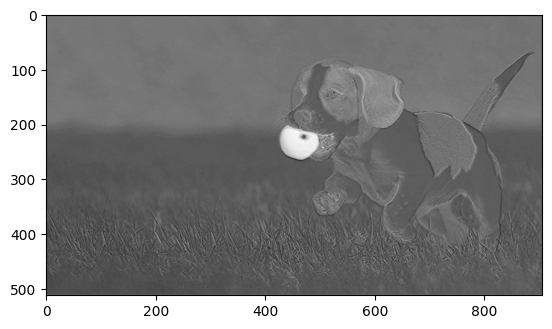

In [33]:
with torch.no_grad():
    img_out= conv_kernel(test_img1.unsqueeze(0))
    
_= plt.imshow(img_out[0,0],cmap='gray')    

In [34]:
img_out.shape

torch.Size([1, 1, 512, 906])

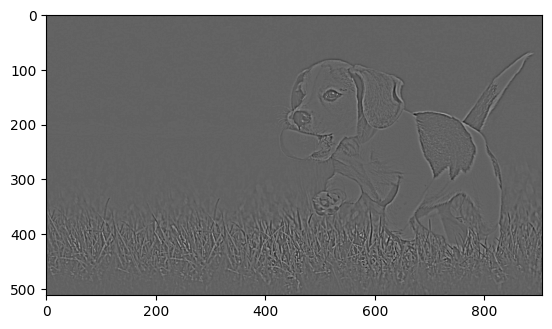

In [35]:
blur = T.GaussianBlur(7,4)

target = test_img1.unsqueeze(0) - blur(test_img1.unsqueeze(0))
_= plt.imshow(torch.squeeze(target[0,0]),cmap='gray')

In [36]:
logger = []

for _ in trange(2000):
    img_out = conv_kernel(test_img1.unsqueeze(0))
    
    loss = (target - img_out).pow(2).mean()
    logger.append(loss)
    
    conv_kernel.zero_grad()
    loss.backward()
    optimizer.step()
    
    

  0%|          | 0/2000 [00:00<?, ?it/s]

In [39]:
loss= [l.item() for l in logger]


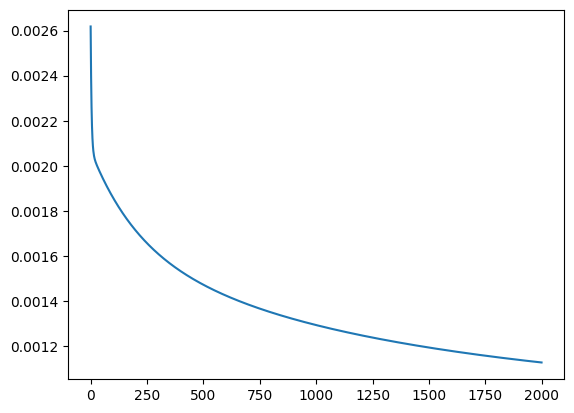

In [41]:
plt.plot(loss)

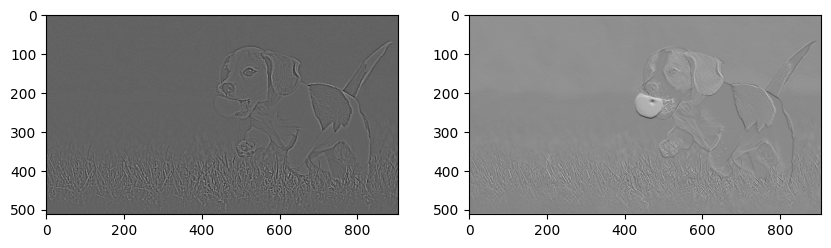

In [43]:
f, (ax1,ax2) =plt.subplots(1,2, sharex=True, figsize=(10,10))
ax2.imshow(torch.squeeze(img_out[0,0].detach()), cmap='gray')
ax1.imshow(torch.squeeze(target[0,0]), cmap='gray')